## Editar imatges per ser tractades posteriorment i calcular la PSF

In [10]:
from skimage import io, exposure, filters, restoration
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import os
from skimage.feature import peak_local_max
from scipy.stats import norm
from skimage.filters import threshold_otsu
from scipy.special import j1
from skimage.morphology import opening, square


In [2]:
path_img = "C:/Users/cristina soler/Documents/UNIVERSITAT/TFG/images"
images = os.listdir(path_img)

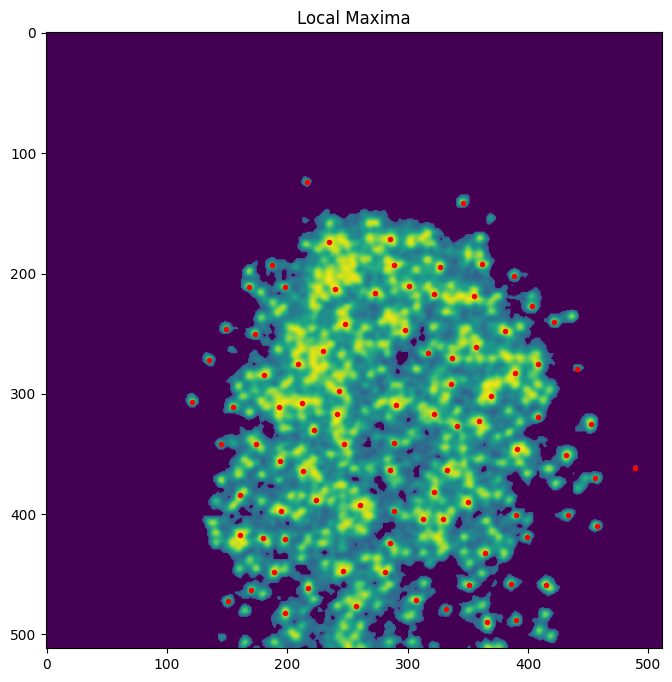

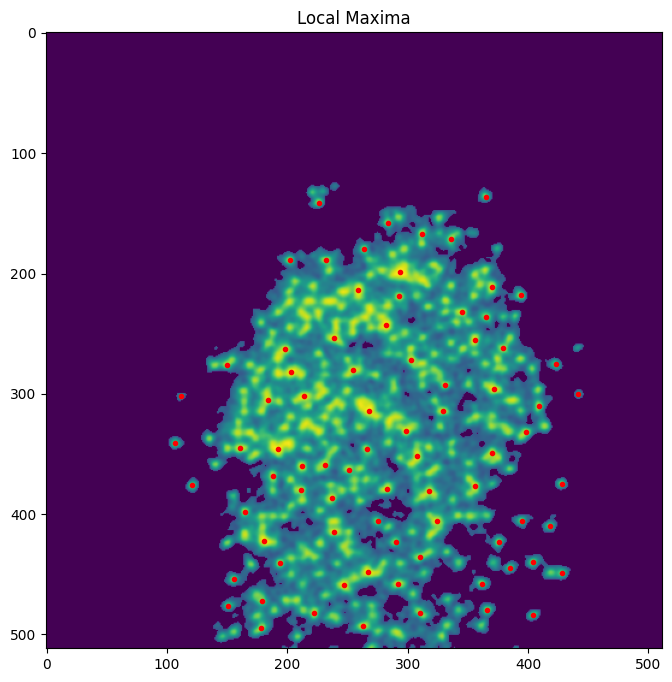

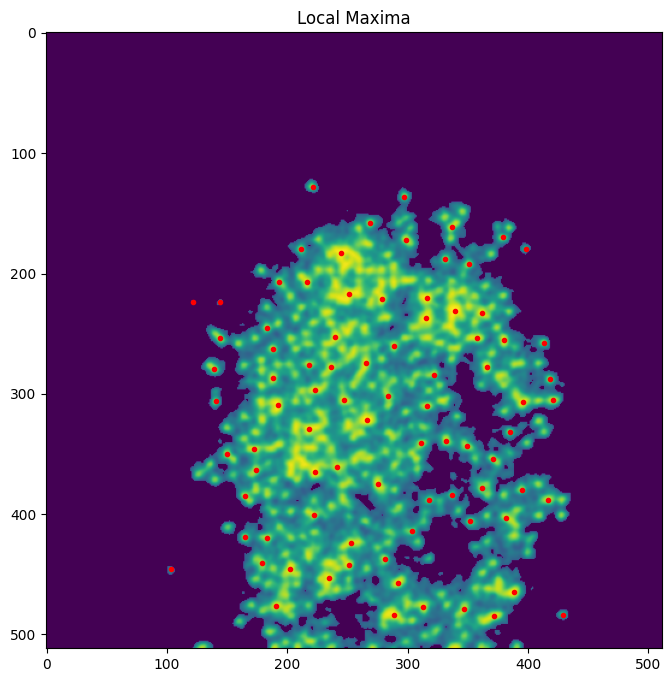

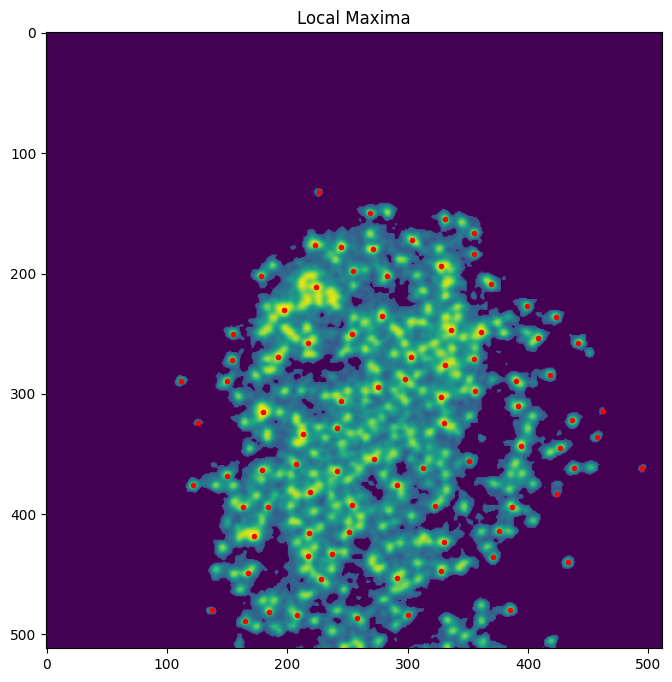

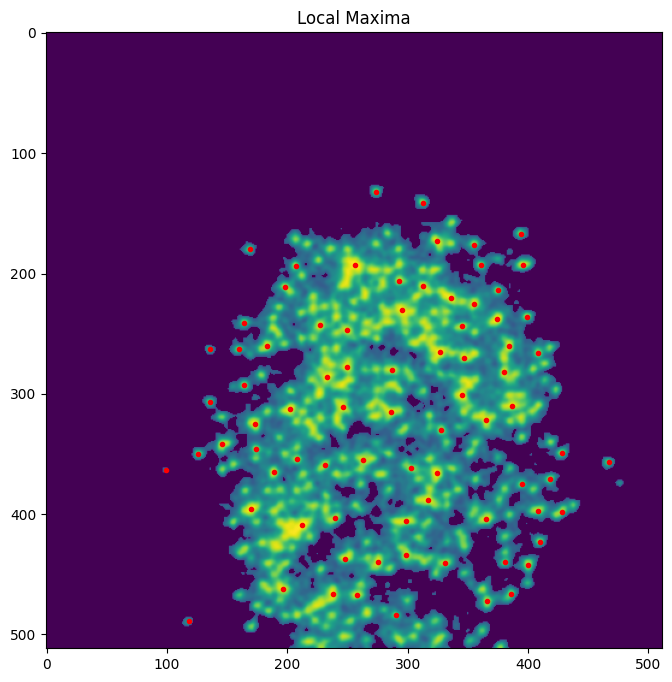

...

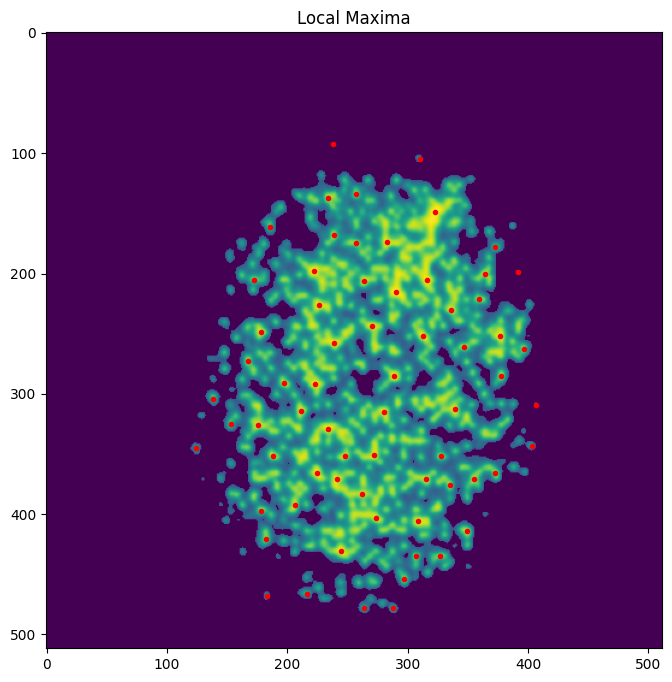

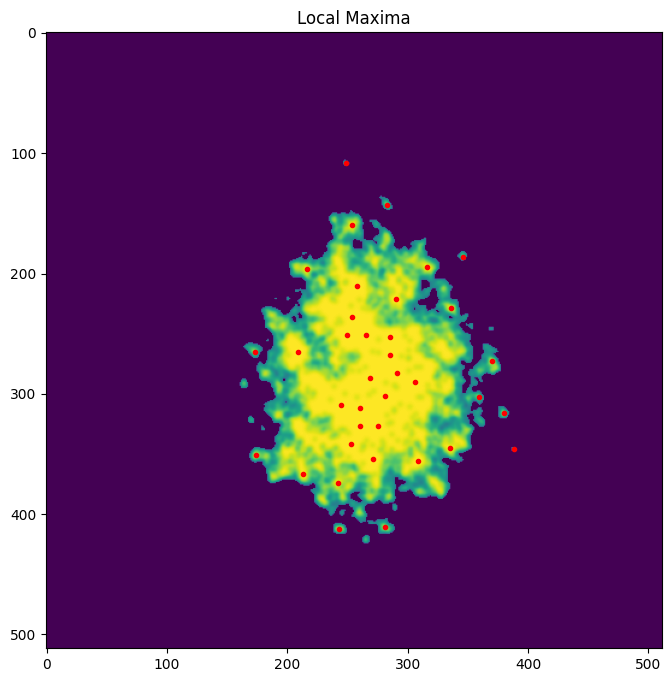

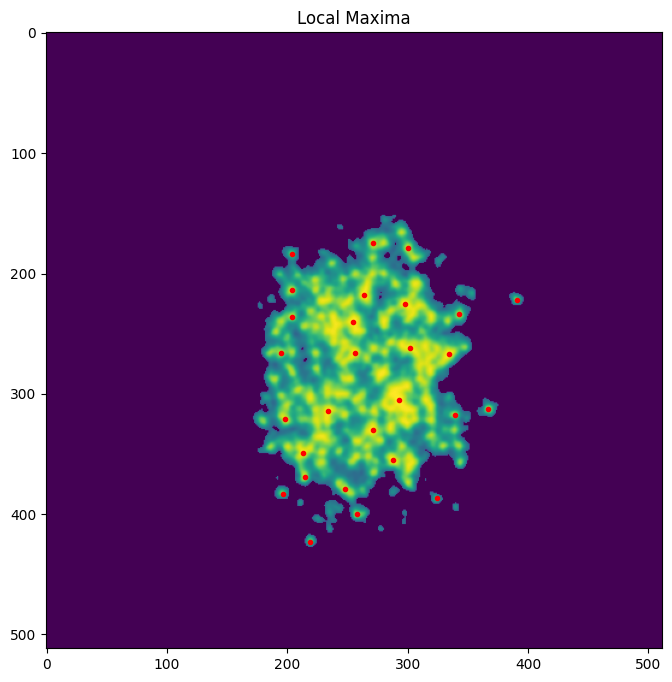

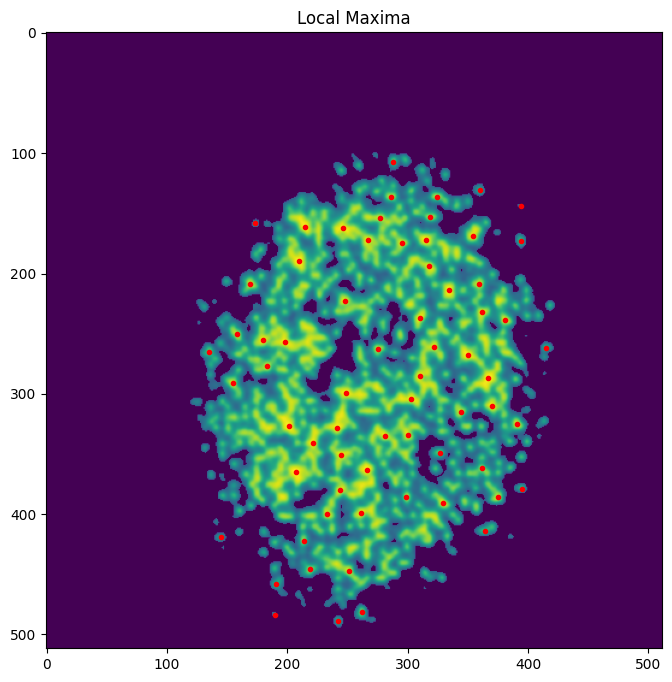

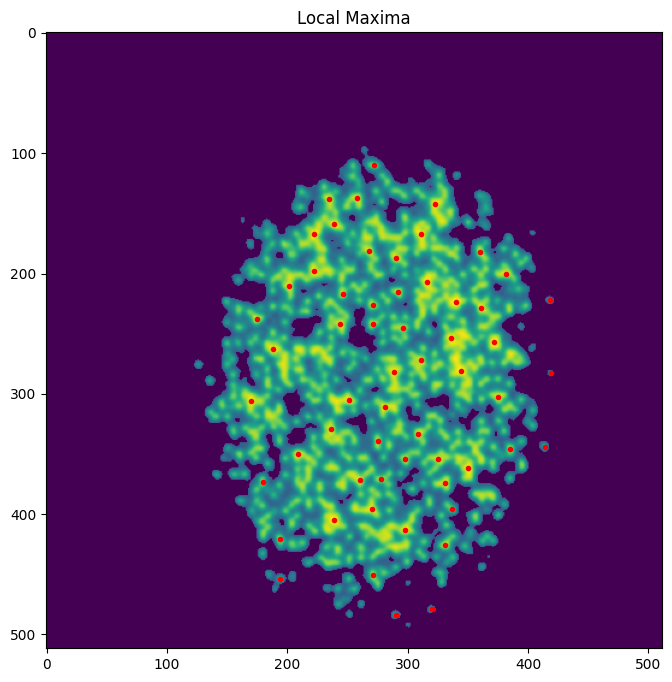

In [3]:
list_is = []
# Busquem els màxims locals de la imatge
for img in images:
    img = cv.imread(path_img +"/"+ img, cv.IMREAD_GRAYSCALE)

    #Millorem contrast i eliminem soroll de fons
    p2, p98 = np.percentile(img, (5, 95))
    img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))

    img_filtered = filters.gaussian(img_rescale, sigma=2)

    #Eliminem valors petits a les imatges, ens pot ajudar a reduïr el soroll que es genera de fons
    selem_size = 3  # This value may need to be adjusted based on the actual image characteristics
    selem = square(selem_size)
    img_morph_opened = opening(img_filtered, selem)

    background = np.median(img_filtered)
    img_subtracted = img_filtered - background
    img_subtracted[img_subtracted < 0] = 0

    # Eliminem el fons amb la binarització de OTSU
    thresh = threshold_otsu(img_subtracted)
    binary_mask = img_subtracted > thresh

    # Fem servir la mascara binaria per extreure les imatges
    img_subtracted_mask = img_subtracted * binary_mask

    # Detectem els pics de les imatges com a maxims locals, a una distancia de com a minim 20 entre ells
    coordinates = peak_local_max(img_subtracted_mask, min_distance=15)

    plt.figure(figsize=(8, 8))
    plt.imshow(img_subtracted_mask, cmap='viridis')
    plt.autoscale(False)
    plt.plot(coordinates[:, 1], coordinates[:, 0], 'r.')
    plt.title('Local Maxima')
    plt.show()

    # Volem seleccionar un punt que sembli aïllat dels altres d'aquest màxim
    isolated_points = sorted(coordinates, key=lambda p: img[p[0], p[1]], reverse=True)
    list_is.append(isolated_points)

Coses a millorar:
- Detecció de punts màxims, intentar buscar més els que destaquen i menys els que troba en el soroll

Fem un filtre per eliminar aquells punts que no són àtoms de veritat, i en conseqüència soroll, i també eliminem aquells punts que tenen altres molt propers, ja que estem buscant els que estan aïllats.

Caldria fer una cerca de hyperparametres per mirar quins són els valors que optimitzen el resultat.

In [4]:
def filter_peaks(peaks, img, intensity_threshold, neighborhood_size):
    filtered_peaks = []
    for peak in peaks:
        if img[peak[0], peak[1]] < intensity_threshold:
            continue
        neighborhood = img[
            max(peak[0] - neighborhood_size, 0):min(peak[0] + neighborhood_size, img.shape[0]),
            max(peak[1] - neighborhood_size, 0):min(peak[1] + neighborhood_size, img.shape[1])
        ]
        if img[peak[0], peak[1]] == np.max(neighborhood):
            filtered_peaks.append(peak)

    return filtered_peaks

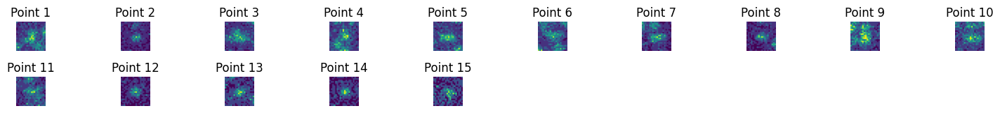

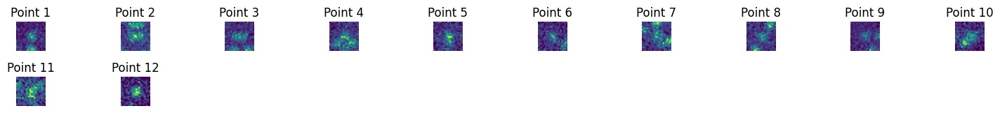

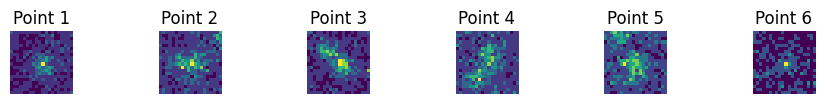

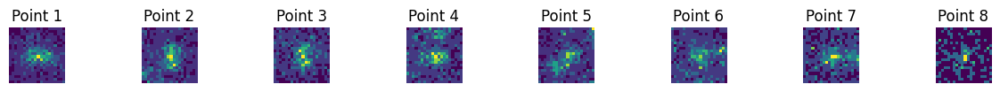

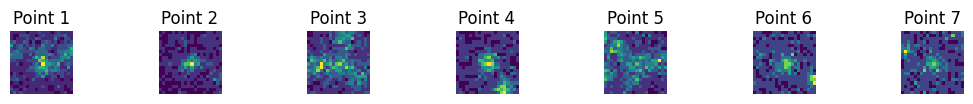

...

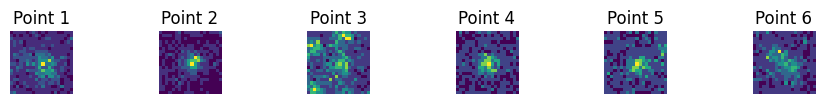

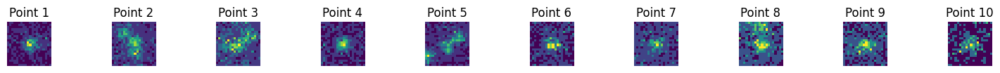

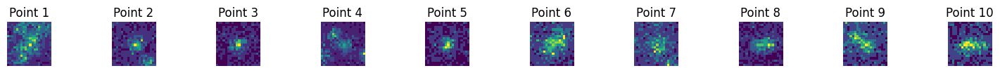

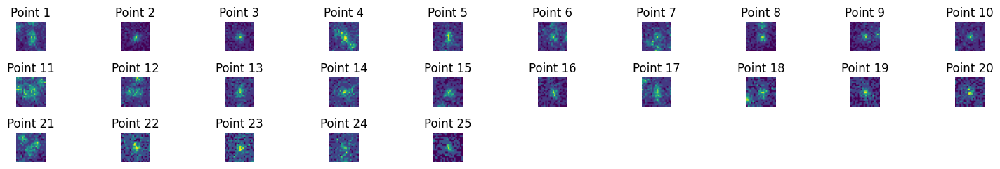

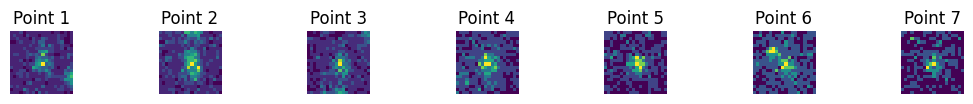

<Figure size 1500x1200 with 0 Axes>

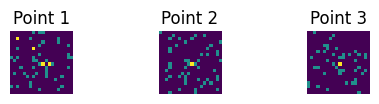

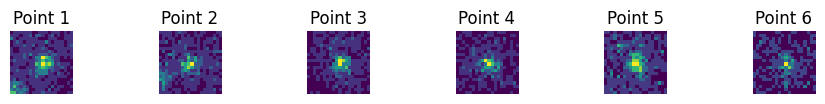

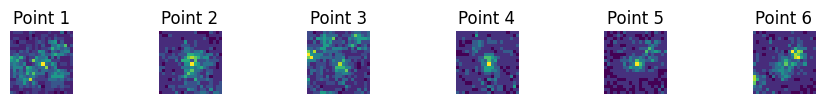

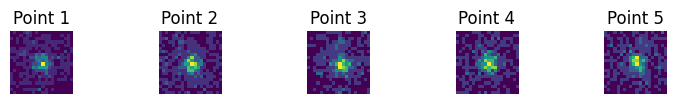

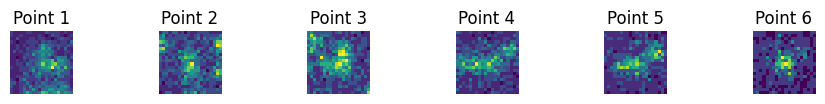

...

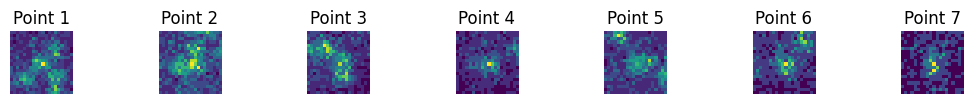

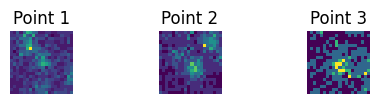

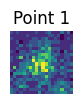

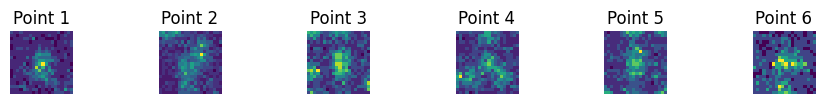

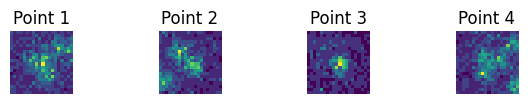

In [5]:
k = 0
max_points_filtered = []
max_images = []

for img in images:
    img = cv.imread(path_img +"/"+ img, cv.IMREAD_GRAYSCALE)
    # Mirem els punts que ha trobat la busqueda del màxim, i intentem triar la que trobi un atom aïllat.
    # Busquem la intensitat mitjana dels punts per cada imatge 
    intensity_threshold = np.median(img) + (3 * np.std(img))
    # Restringim a 3 els veins propers que com a maxim pot tenir
    neighborhood_size = 3
    filtered_peaks = filter_peaks(list_is[k], img, intensity_threshold, neighborhood_size)
    max_points_filtered.append(filtered_peaks)
    
    # Prova visual
    plt.figure(figsize=(15, 12))
    for i, point in enumerate(filtered_peaks[:len(filtered_peaks)]):
        plt.subplot(15,10, i + 1)  
        # Les imatges són centrades
        crop_img = img[point[0]-10:point[0]+10, point[1]-10:point[1]+10]
        max_images.append(crop_img)
        plt.imshow(crop_img, cmap='viridis')
        plt.title(f'Point {i+1}')
        plt.axis('off')

    plt.tight_layout() 
    plt.show()

    k = k + 1

Veiem que encara tenim diversos punts que no sereien els millors per fer el càlcul de la PSF

In [6]:
print(len(max_images))

360


Com veiem en comparació amb el paper, disposem només de 124 punts, ells 1187, per tant necessitem augmentar aquesta xifra per poder calibrar-ho correctament

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, convolve

def gaussian_psf(size, sigma):
    x = np.linspace(-size // 2, size // 2, size)
    y = np.linspace(-size // 2, size // 2, size)
    x, y = np.meshgrid(x, y)
    psf = np.exp(-(x**2 + y**2) / (2.0 * sigma**2))
    psf /= np.sum(psf)
    return psf

def richardson_lucy_tikhonov(image, psf, iterations, lambda_reg):
    estimated = np.full(image.shape, 0.5) 
    for _ in range(iterations):
        # Convolve estimated image with the PSF
        estimated_convolved = convolve(estimated, psf, mode='reflect')
        # Add a small constant to avoid division by zero
        estimated_convolved[estimated_convolved == 0] = 1e-5
        relative_blur = image / estimated_convolved
        # Convolve relative_blur with the inverted PSF
        correction = convolve(relative_blur, psf[::-1, ::-1], mode='reflect')
        # Update estimated image
        estimated *= correction
        # Apply Tikhonov regularization
        estimated = (estimated + lambda_reg * estimated) / (1 + lambda_reg)
    return estimated

#buscar aquests valors al paper
psf = gaussian_psf(20, 3)

save_deconvolved = []

for img in max_images:
    blurred_image = gaussian_filter(img, sigma=2.5)
    iterations = 15 #Són les mateixes que fan al paper
    lambda_reg = 0.001 # Penalització
    deconvolved_image_tikhonov = richardson_lucy_tikhonov(blurred_image, psf, iterations, lambda_reg)
    save_deconvolved.append(deconvolved_image_tikhonov)

psf_average = np.mean(np.stack(save_deconvolved), axis=0)

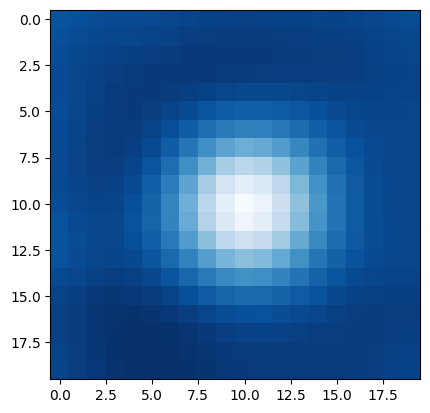

In [8]:
plt.imshow(psf_average, cmap='Blues_r')

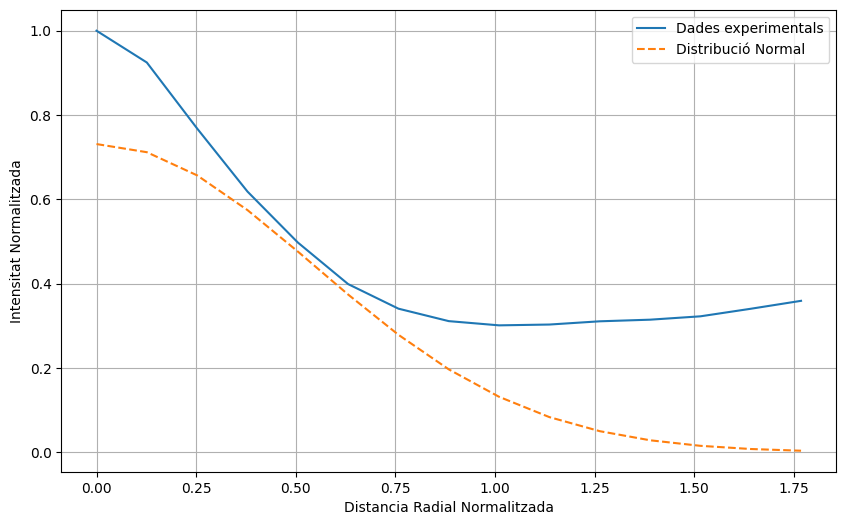

In [70]:
# Calcular el perfil radial
def radial_profile(data, center):
    y, x = np.indices((data.shape))
    r = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    r = r.astype(np.int_)

    tbin = np.bincount(r.ravel(), data.ravel())  
    nr = np.bincount(r.ravel())                 
    radialprofile = tbin / nr

    return radialprofile 

center = (psf_average.shape[0]//2, psf_average.shape[1]//2)

radial_profile = radial_profile(psf_average, center)
radial_profile /= np.max(radial_profile)
radius = np.arange(len(radial_profile))

# Convertir radio en unidades físicas, si se conoce la escala
# por ejemplo, pixel_size en micrómetros por píxel
pixel_size = 16/126.7 #AQUESTA ES LA MIDA IMPORTANT
radius_um = radius * pixel_size

mean = 0
std_dev = np.std(radius_um)

normal_distribution = norm.pdf(radius_um, mean, std_dev)


plt.figure(figsize=(10, 6))
plt.plot(radius_um, radial_profile, label='Dades experimentals')
plt.plot(radius_um, normal_distribution, label='Distribució Normal',  linestyle='--')
plt.xlabel('Distancia Radial Normalitzada')
plt.ylabel('Intensitat Normalitzada')
plt.legend()
plt.grid(True)
plt.show()

Pel que podem intuïr pel baix nivell de punts, la PSF es més gènerica, tmb podria ser ja que no s'ha filtart correctament els punts 

In [62]:
# Define la función radial de Airy
def airy_radial(r):
    # Evita la división por cero
    with np.errstate(divide='ignore', invalid='ignore'):
        result = (2 * j1(np.pi * r) / (np.pi * r))**2
        result[r == 0] = 1  # Define el valor en r=0 manualmente
    return result

# Valores de r normalizados (p.ej., distancias radiales desde el centro)
r = np.linspace(0, 5, 1000)

# Calcular la función radial de Airy
airy_pattern = airy_radial(r)

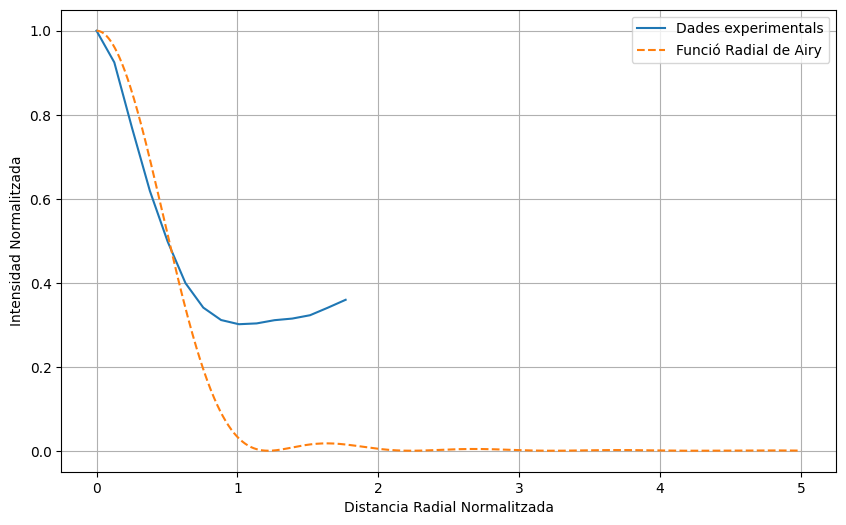

In [67]:
plt.figure(figsize=(10, 6))
plt.plot(radius_um, radial_profile, label='Dades experimentals')
plt.plot(r, airy_pattern, label='Funció Radial de Airy',  linestyle='--')
plt.xlabel('Distancia Radial Normalitzada')
plt.ylabel('Intensidad Normalitzada')
plt.legend()
plt.grid(True)
plt.show()